<a href="https://colab.research.google.com/github/Mahantesh-Pattadkal-1993/CounterFactuals_GANs/blob/main/Training_the_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
import os
os.chdir('/content/gdrive/My Drive/Github')

In [4]:
# Cloning the GitHub repo so that I dont have to upload everything here
#!git clone https://github.com/Mahantesh-Pattadkal-1993/CounterFactuals_GANs.git


In [5]:
#Setting up the path for GAN Training
import os
os.chdir('/content/gdrive/MyDrive/Github/CounterFactuals_GANs/MNIST')

In [6]:
#Import the libraries 
import torch
import torch.optim as opt
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms

import random
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from GAN_Models import DC_Generator, DC_Discriminator



# Set random seed for reproducibility
manualSeed = 2021
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)


Random Seed:  2021


In [7]:
#Loading the data

mb_size = 64

transform = transforms.Compose(
		[transforms.ToTensor(),
		 transforms.Normalize((0.5,), (0.5,))])


trainData = torchvision.datasets.MNIST('./data/', download=True, transform=transform, train=True)

trainLoader = torch.utils.data.DataLoader(trainData, shuffle=True, batch_size=mb_size)

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [8]:
dataIter = iter(trainLoader)

imgs, labels = dataIter.next()

In [9]:
imgs.shape

torch.Size([64, 1, 28, 28])

In [10]:
def imshow(imgs):
    imgs = torchvision.utils.make_grid(imgs) # makes grid of the tensor images passed
    npimgs = imgs.numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(npimgs, (1,2,0)), cmap='Greys_r' )
    plt.xticks([])
    plt.yticks([])
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


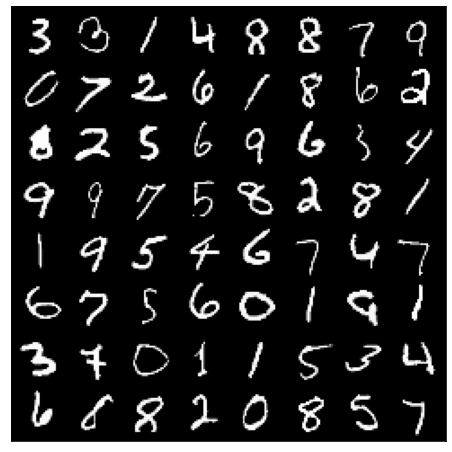

In [11]:
imshow(imgs)

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # PyTorch v0.4.0

G = DC_Generator().to(device)
D = DC_Discriminator().to(device)

lr = 1e-3

g_opt = opt.Adam(G.parameters(), lr=lr)
d_opt = opt.Adam(D.parameters(), lr=lr)

In [13]:
# This cell can be used to check the architecture of the network

from torchsummary import summary

#model = G(nc=1,nz=100,ngf=28).to(device)
#input for Generator = (bs,100,1,1)
#bs =64
#summary(G,(bs,100,1,1))

summary(D, (1,28,28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 28, 14, 14]             448
         LeakyReLU-2           [-1, 28, 14, 14]               0
            Conv2d-3             [-1, 56, 7, 7]          25,088
       BatchNorm2d-4             [-1, 56, 7, 7]             112
         LeakyReLU-5             [-1, 56, 7, 7]               0
            Conv2d-6            [-1, 112, 4, 4]          56,448
       BatchNorm2d-7            [-1, 112, 4, 4]             224
         LeakyReLU-8            [-1, 112, 4, 4]               0
            Conv2d-9              [-1, 1, 1, 1]           1,792
          Sigmoid-10              [-1, 1, 1, 1]               0
Total params: 84,112
Trainable params: 84,112
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.19
Params size (MB): 0.32
Estimated Tot

In [13]:
#Setting up the tensorboard
from torch.utils.tensorboard import SummaryWriter

# default `log_dir` is "runs" - we'll be more specific here
writer = SummaryWriter('runs/GAN_trial_08_23')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:0,   G_loss:8.826257153996018,    D_loss:0.03279179716753551


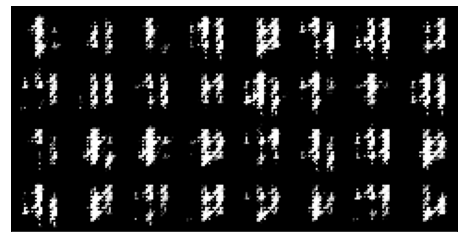

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1,   G_loss:8.1148408707271,    D_loss:0.040840818741224034


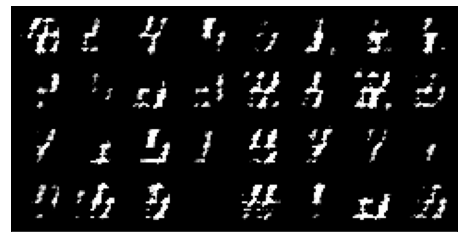

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2,   G_loss:7.422712027899492,    D_loss:0.05155630888385591


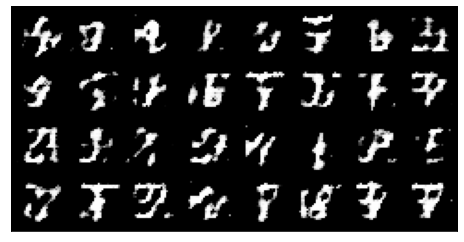

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3,   G_loss:6.559943131546476,    D_loss:0.11821494355556002


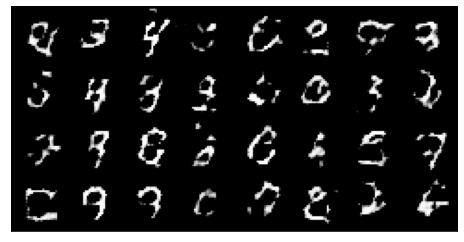

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4,   G_loss:4.900977258425532,    D_loss:0.2152071534933995


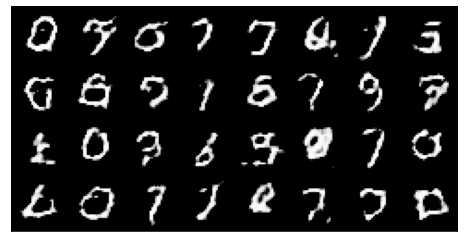

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5,   G_loss:3.9044182587788305,    D_loss:0.26459260775781135


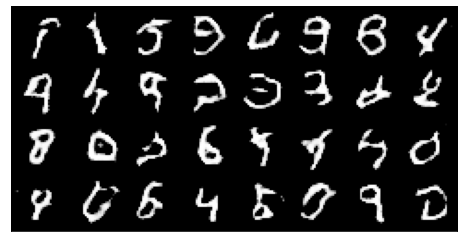

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6,   G_loss:3.4713692185339897,    D_loss:0.37368191091188874


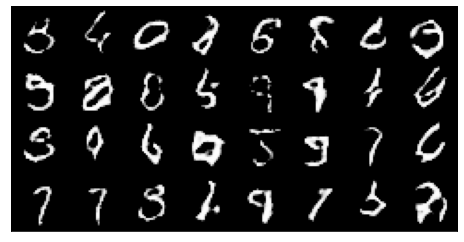

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7,   G_loss:3.174889287246125,    D_loss:0.3670599385142835


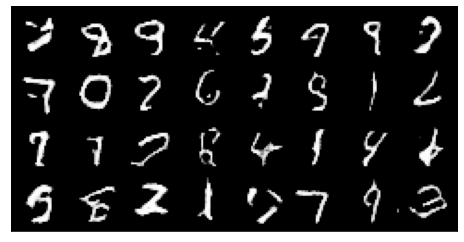

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8,   G_loss:3.1645867953867293,    D_loss:0.3628253106877748


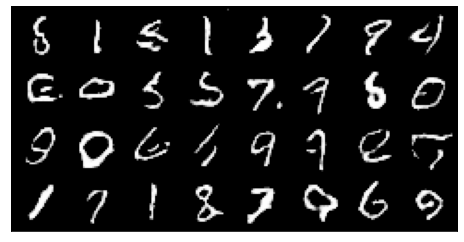

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9,   G_loss:3.196432444300733,    D_loss:0.36945912442497736


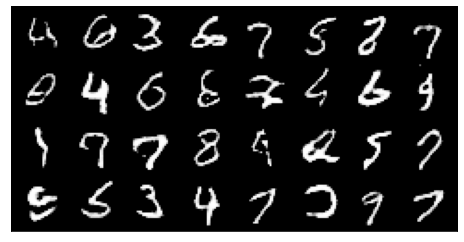

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10,   G_loss:3.1962712196144722,    D_loss:0.3619536834159322


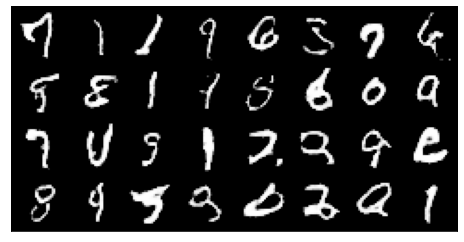

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11,   G_loss:3.2054744511207285,    D_loss:0.3275811336179977


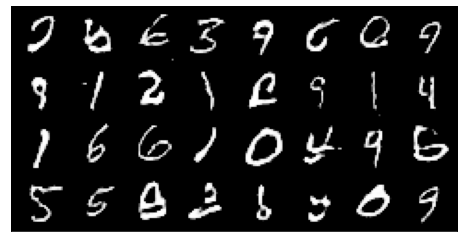

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12,   G_loss:3.3522728472503265,    D_loss:0.3133667565739231


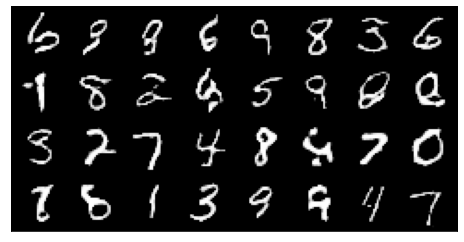

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13,   G_loss:3.501175237076877,    D_loss:0.32314834678605164


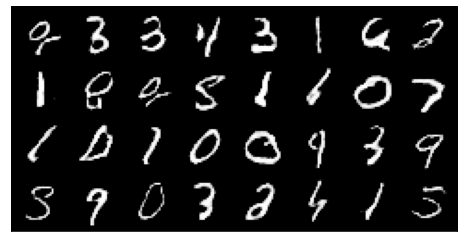

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14,   G_loss:3.5368735707009527,    D_loss:0.3064982018816763


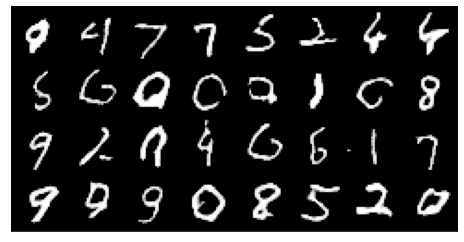

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15,   G_loss:3.512014007708157,    D_loss:0.2949026935616695


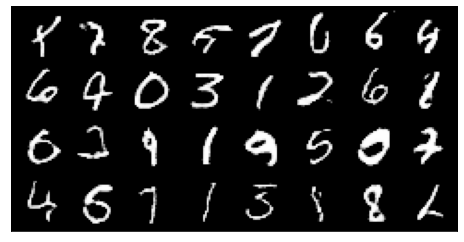

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16,   G_loss:3.6017943973988613,    D_loss:0.2857254122588426


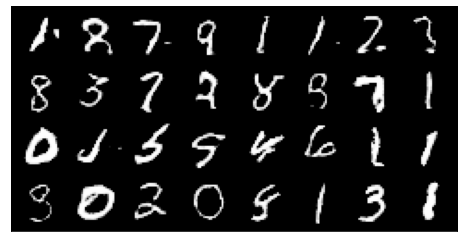

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17,   G_loss:3.6914107464015613,    D_loss:0.2635101475981253


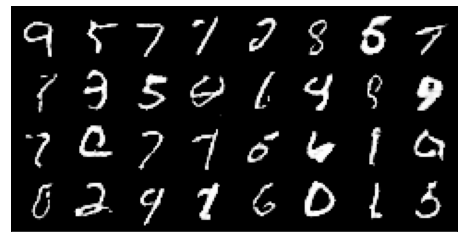

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:18,   G_loss:3.7266562922931175,    D_loss:0.2987001065585786


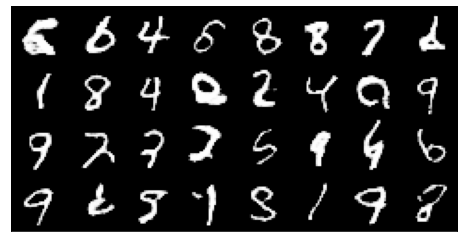

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:19,   G_loss:3.8414946092344295,    D_loss:0.22978269504204488


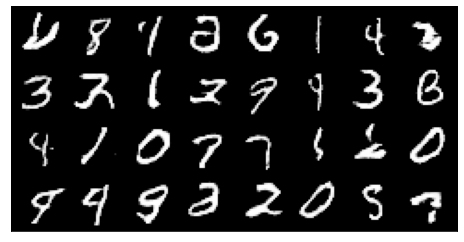

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:20,   G_loss:3.9422857061123797,    D_loss:0.22120141299929955


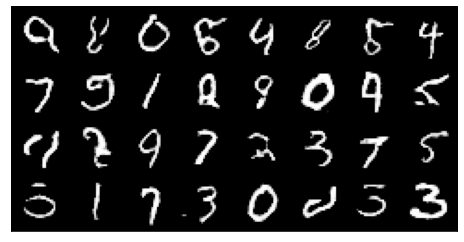

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:21,   G_loss:3.848530273257034,    D_loss:0.28554972140654633


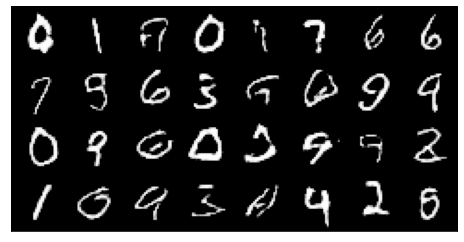

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:22,   G_loss:3.9640866564725763,    D_loss:0.23847846376663967


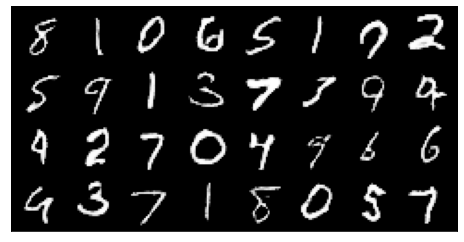

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:23,   G_loss:3.998795672456847,    D_loss:0.22047744116096546


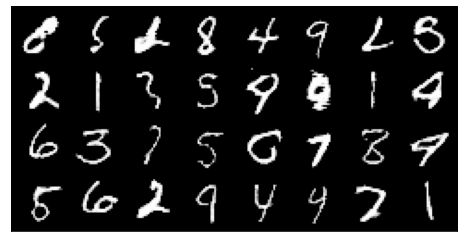

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:24,   G_loss:4.115392790722059,    D_loss:0.19853403434943734


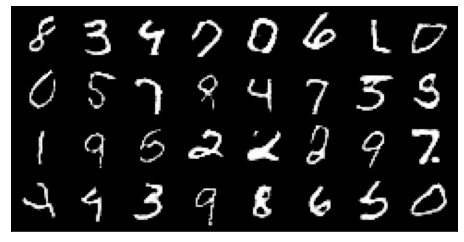

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:25,   G_loss:4.089129215042823,    D_loss:0.23891373942179212


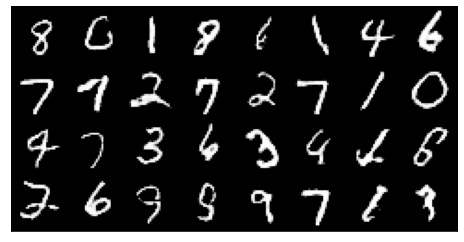

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:26,   G_loss:4.131999822885497,    D_loss:0.24357603258961666


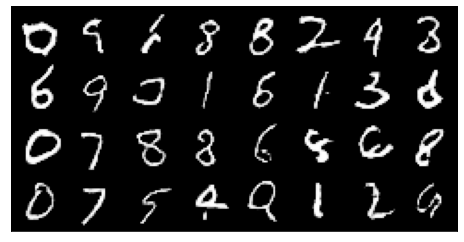

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:27,   G_loss:4.267589466022784,    D_loss:0.1976450251858197


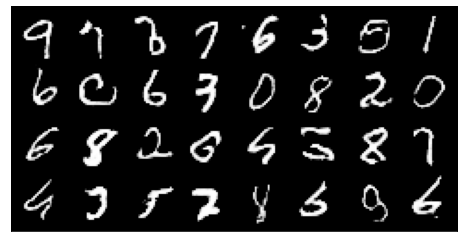

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:28,   G_loss:4.224320462612964,    D_loss:0.24910476608479867


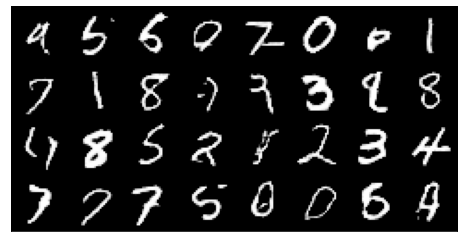

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:29,   G_loss:4.317639151012211,    D_loss:0.19645110524293266


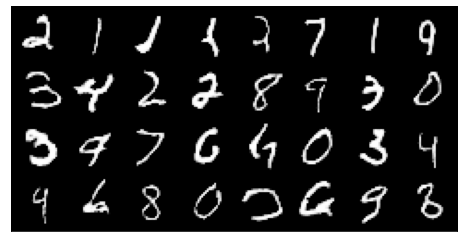

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:30,   G_loss:4.417236811125965,    D_loss:0.17757166459211218


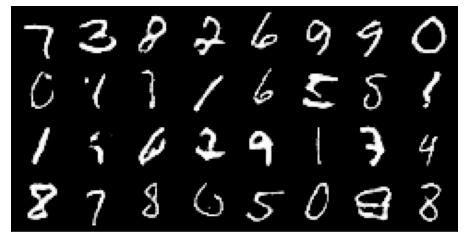

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:31,   G_loss:4.3533619118969575,    D_loss:0.22204713147483082


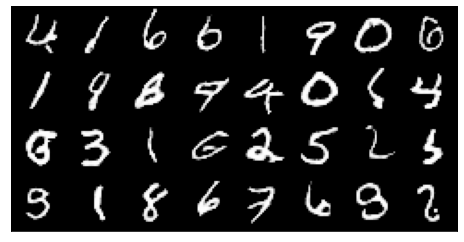

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:32,   G_loss:4.27872372996896,    D_loss:0.21347453503279704


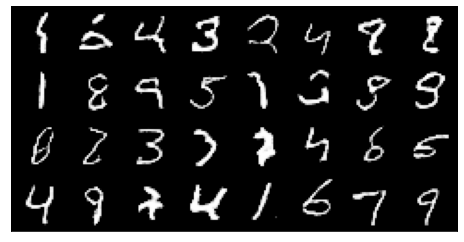

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:33,   G_loss:4.589241539110253,    D_loss:0.1943609517450923


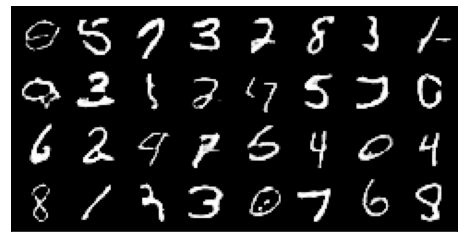

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:34,   G_loss:4.392524364787633,    D_loss:0.20933638162402582


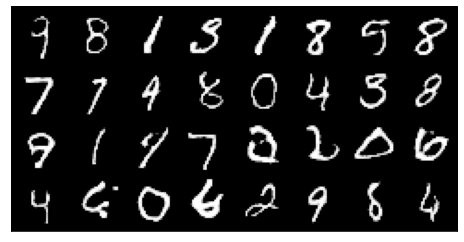

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:35,   G_loss:4.582258735511349,    D_loss:0.17200498663033964


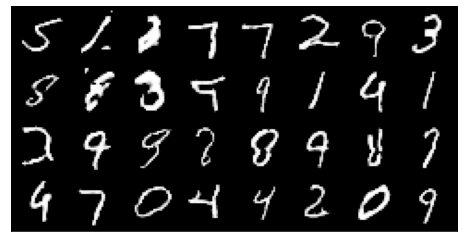

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:36,   G_loss:4.6192208423193835,    D_loss:0.19447658037238602


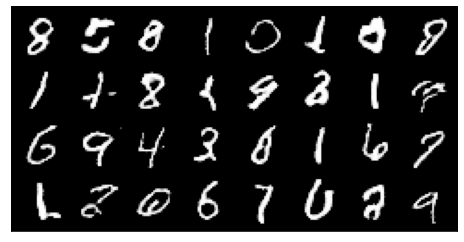

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:37,   G_loss:4.550409508158149,    D_loss:0.16558468574608393


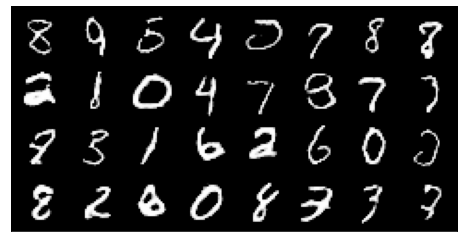

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:38,   G_loss:4.662494779625999,    D_loss:0.15781327338565562


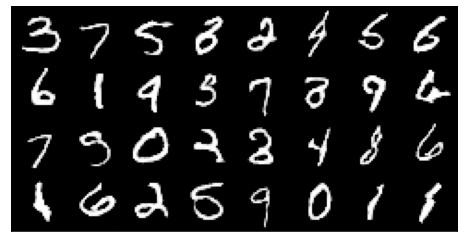

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:39,   G_loss:4.607420021727649,    D_loss:0.1910182613038472


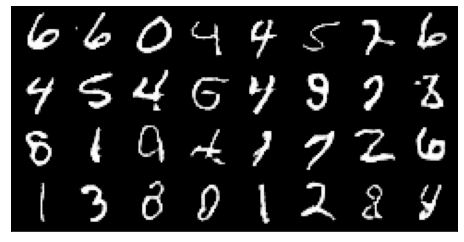

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:40,   G_loss:4.674173311908235,    D_loss:0.1932949182750689


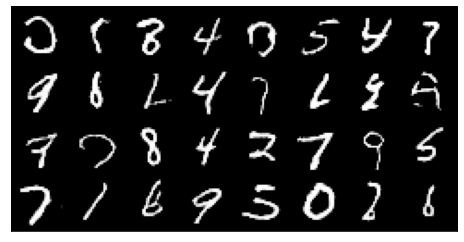

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:41,   G_loss:4.7389761946444064,    D_loss:0.17151430331548848


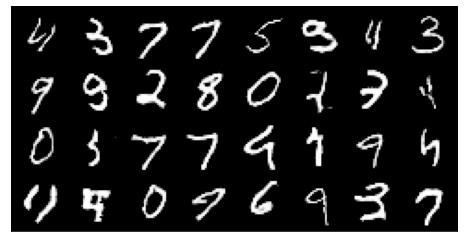

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:42,   G_loss:4.849184573649851,    D_loss:0.17072089828564715


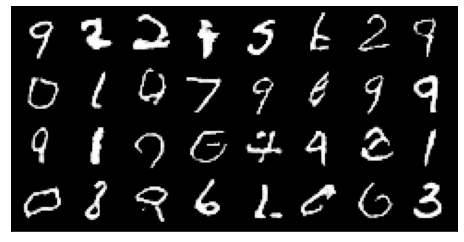

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:43,   G_loss:4.65594196835084,    D_loss:0.18071980805033003


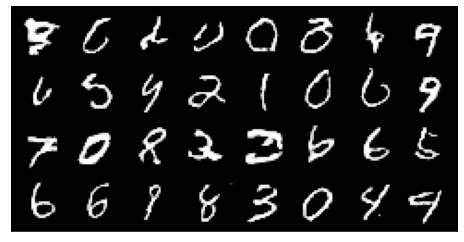

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:44,   G_loss:4.690946619044235,    D_loss:0.17681299910487444


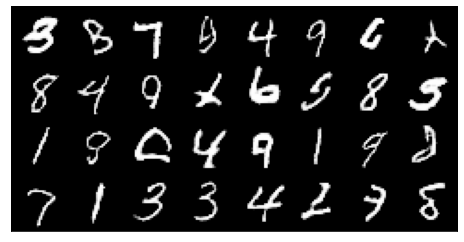

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:45,   G_loss:4.896472396579251,    D_loss:0.1687697187763081


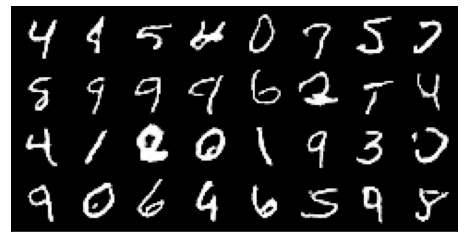

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:46,   G_loss:4.904308486817234,    D_loss:0.13363588336226678


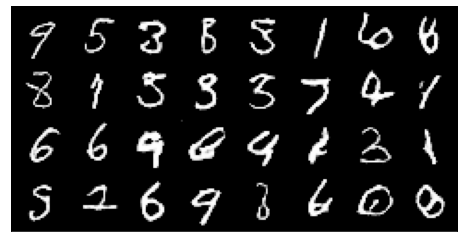

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:47,   G_loss:4.912529734501453,    D_loss:0.1666557143764026


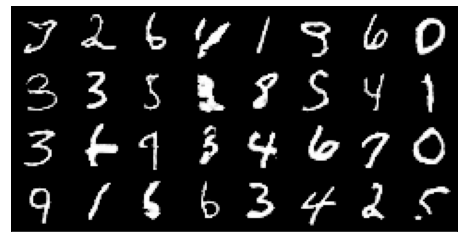

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:48,   G_loss:4.940845383160404,    D_loss:0.15398778608004288


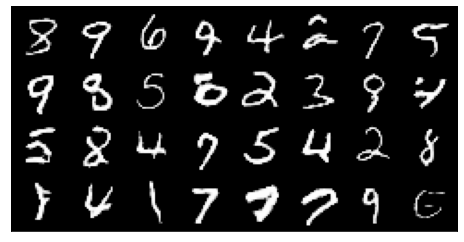

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:49,   G_loss:4.691027275240942,    D_loss:0.2143668076177356


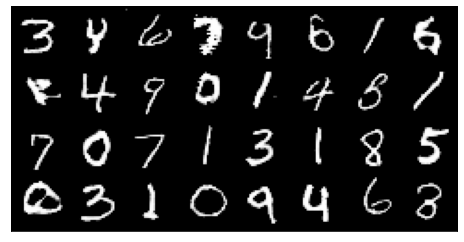

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:50,   G_loss:4.8240517249652575,    D_loss:0.1779737455764416


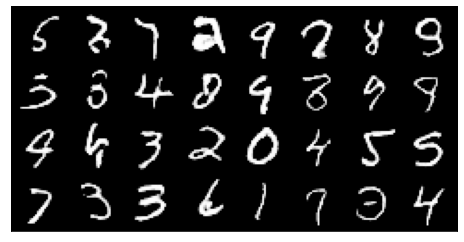

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:51,   G_loss:4.973906765360313,    D_loss:0.1308578928465397


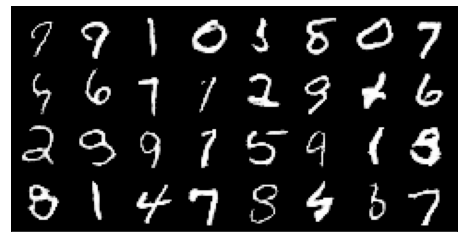

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:52,   G_loss:5.154003727188242,    D_loss:0.16856815322597168


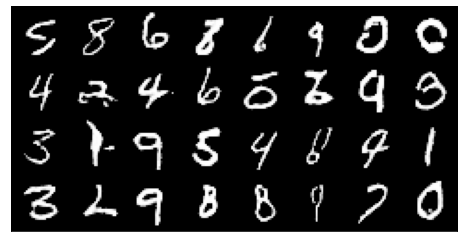

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:53,   G_loss:4.7818796255949465,    D_loss:0.1695962907649132


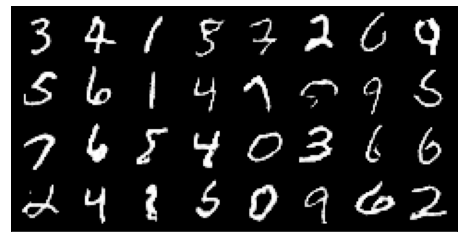

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:54,   G_loss:5.048347324768363,    D_loss:0.13046893882063795


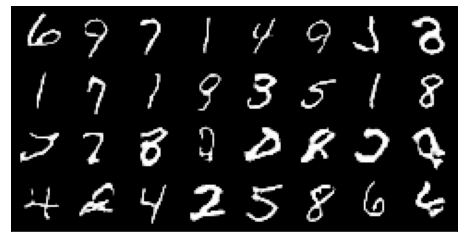

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:55,   G_loss:5.017626430886958,    D_loss:0.2054375490480994


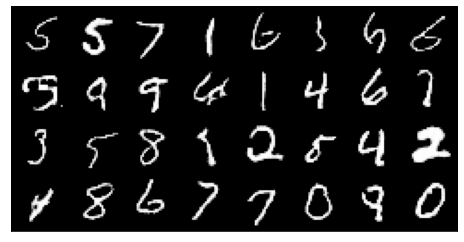

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:56,   G_loss:4.885214533219968,    D_loss:0.1735163823912925


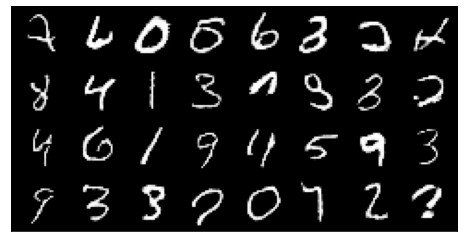

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:57,   G_loss:5.132951035110681,    D_loss:0.09715718477080737


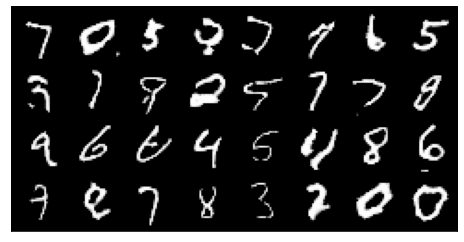

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:58,   G_loss:4.989231297662899,    D_loss:0.20673626787396573


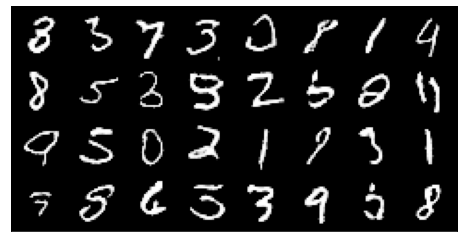

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:59,   G_loss:4.9585451485473975,    D_loss:0.15784634417866164


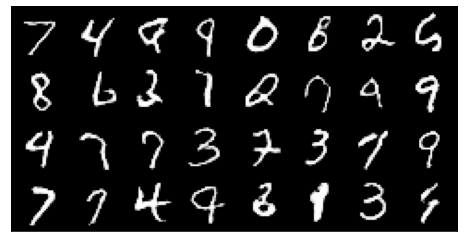

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:60,   G_loss:5.32903806919228,    D_loss:0.11080479825254101


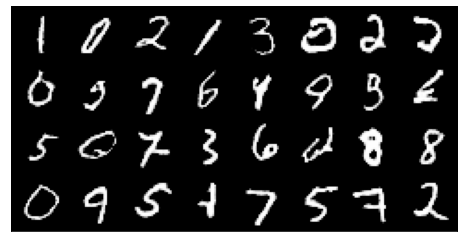

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:61,   G_loss:5.029725297237002,    D_loss:0.16061972064434735


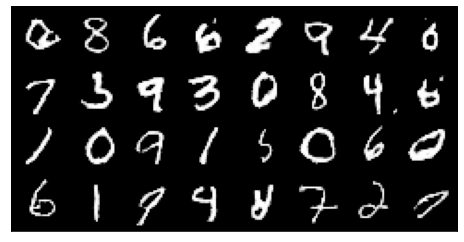

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:62,   G_loss:5.201307888414814,    D_loss:0.09783104387298623


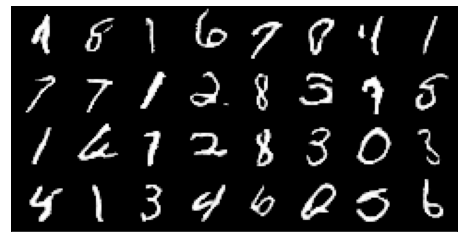

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:63,   G_loss:5.152855294186677,    D_loss:0.1538291185208634


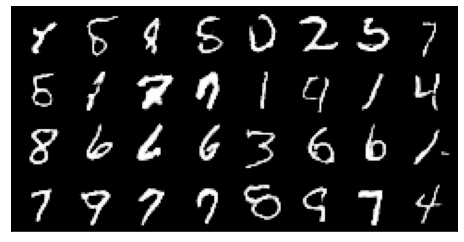

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:64,   G_loss:5.265844372043541,    D_loss:0.1778640278628958


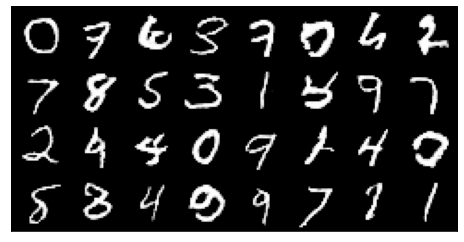

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:65,   G_loss:5.211599416315937,    D_loss:0.12594449947645733


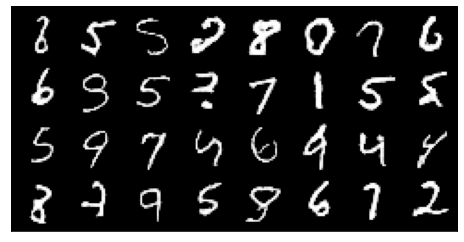

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:66,   G_loss:5.329542460059052,    D_loss:0.11278131103224016


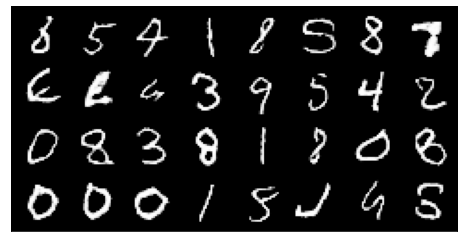

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:67,   G_loss:5.299795377276727,    D_loss:0.17446258237068135


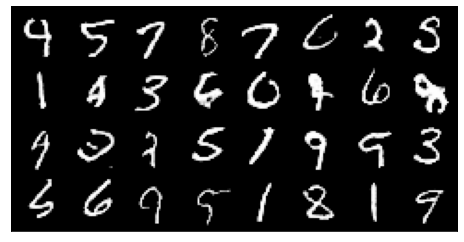

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:68,   G_loss:5.271915948213036,    D_loss:0.12019421272391854


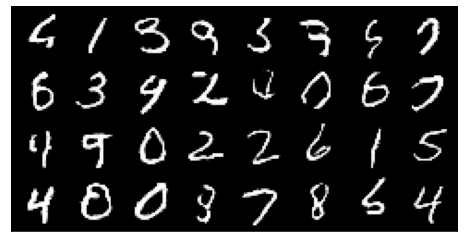

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:69,   G_loss:5.4227710860942215,    D_loss:0.12179811763031576


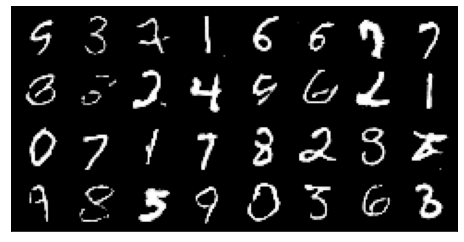

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:70,   G_loss:5.289832216812603,    D_loss:0.15378632679579657


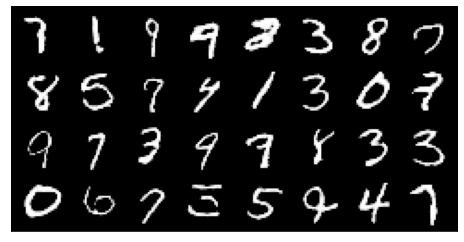

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:71,   G_loss:5.21455156633547,    D_loss:0.19928596569334409


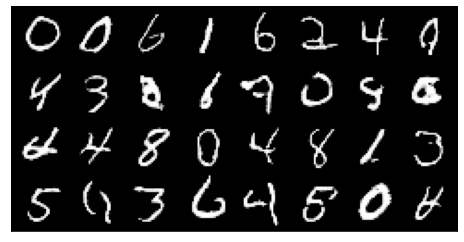

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:72,   G_loss:5.362261461264797,    D_loss:0.09739508710653662


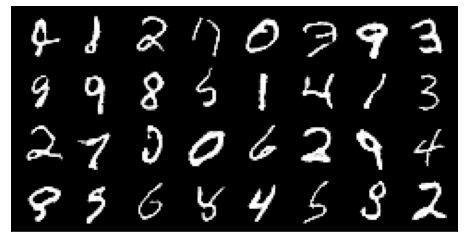

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:73,   G_loss:5.358054251781405,    D_loss:0.1470324018757159


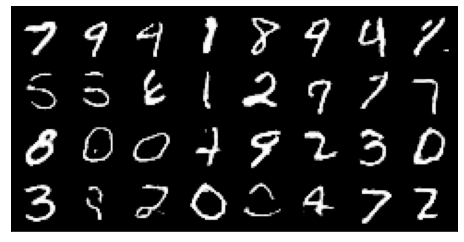

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:74,   G_loss:5.221970015529122,    D_loss:0.16429255823262218


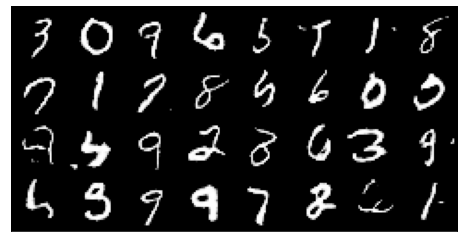

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:75,   G_loss:5.249345509355257,    D_loss:0.16171858417501211


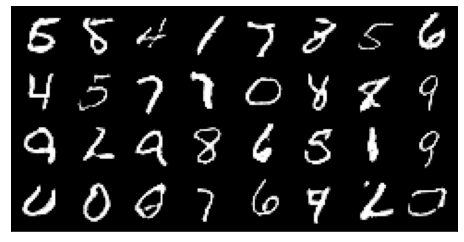

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:76,   G_loss:5.586869205366066,    D_loss:0.1175713405453179


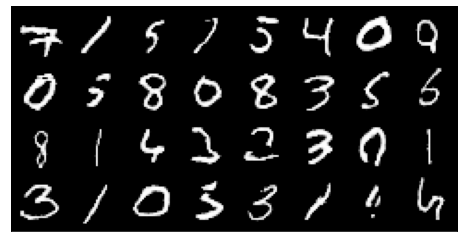

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:77,   G_loss:5.410121243081685,    D_loss:0.12632257850500128


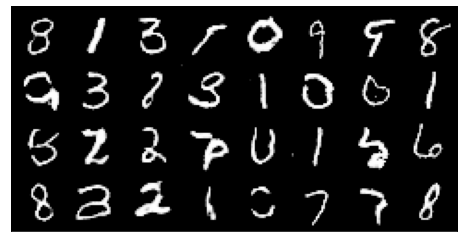

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:78,   G_loss:5.296586847254463,    D_loss:0.1894154734524793


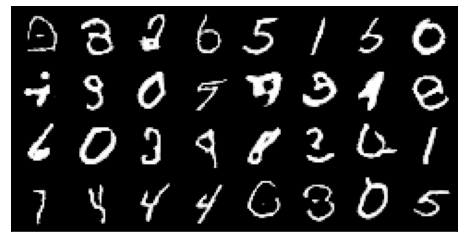

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:79,   G_loss:5.3595713993379555,    D_loss:0.1211768286293998


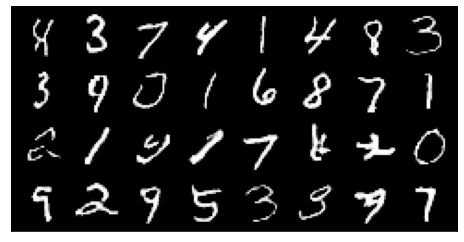

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:80,   G_loss:5.458644283252325,    D_loss:0.13695733400899718


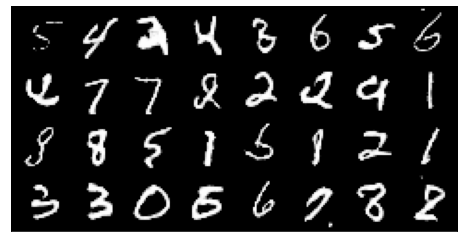

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:81,   G_loss:5.411174340280834,    D_loss:0.11194101721693728


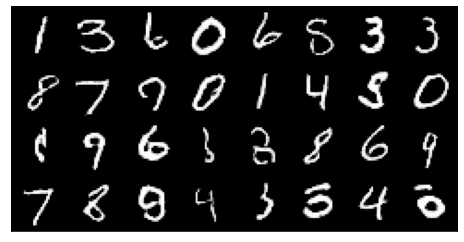

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:82,   G_loss:5.468783866177236,    D_loss:0.1221975588441036


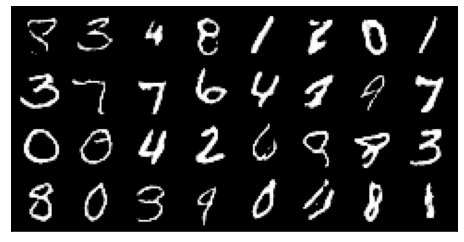

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:83,   G_loss:5.347908961453608,    D_loss:0.13761446734595953


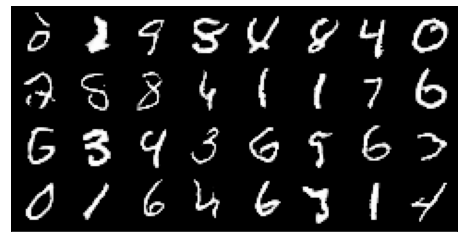

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:84,   G_loss:5.452695736594038,    D_loss:0.13767532141147448


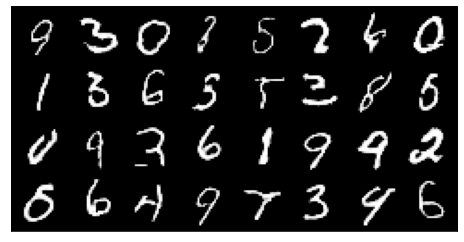

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:85,   G_loss:5.409981694938278,    D_loss:0.1503285338684146


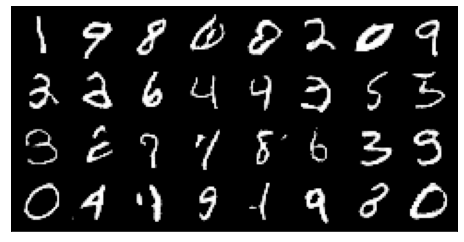

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:86,   G_loss:5.397717216407567,    D_loss:0.08499323800093245


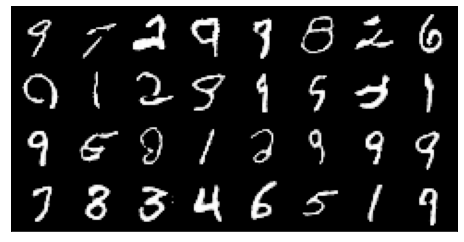

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:87,   G_loss:5.514786913569993,    D_loss:0.17959405619949936


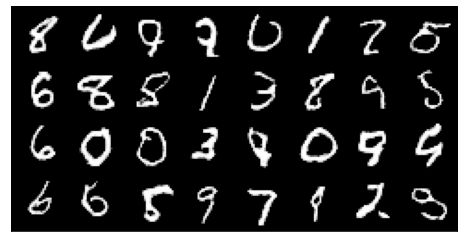

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:88,   G_loss:5.4388557016643,    D_loss:0.11639467017056901


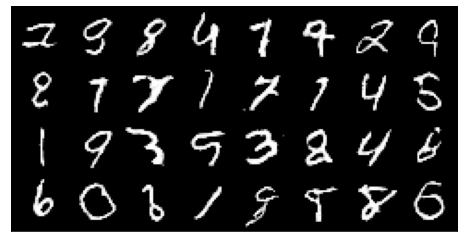

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:89,   G_loss:5.428166027770622,    D_loss:0.17304161921672737


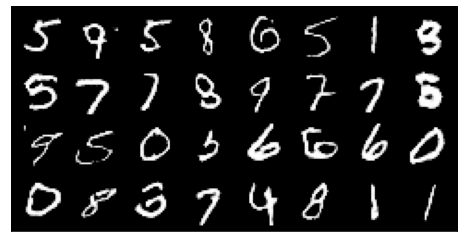

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:90,   G_loss:5.474532339507456,    D_loss:0.140064571961276


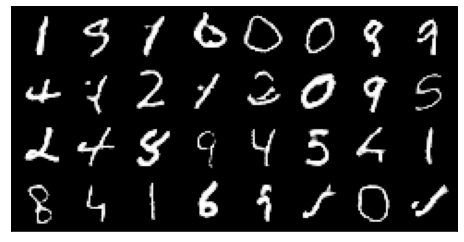

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:91,   G_loss:5.502112601214508,    D_loss:0.12491626638448985


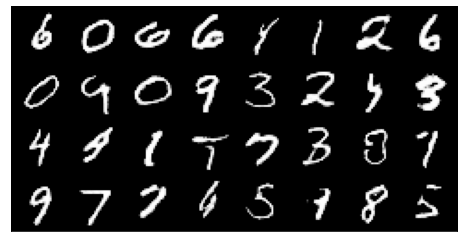

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:92,   G_loss:5.553983351315008,    D_loss:0.10358240576334365


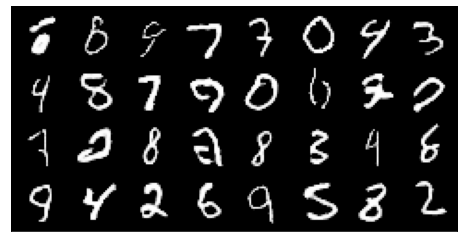

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:93,   G_loss:5.477610586786956,    D_loss:0.13039036104053472


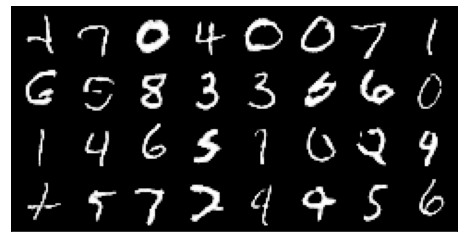

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:94,   G_loss:5.668607754049017,    D_loss:0.07740321554065342


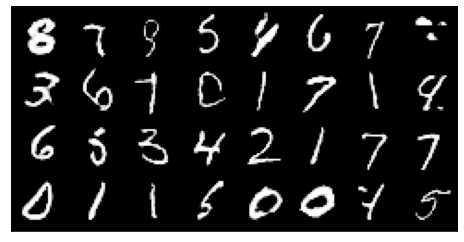

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:95,   G_loss:5.604607965122026,    D_loss:0.17718220127126905


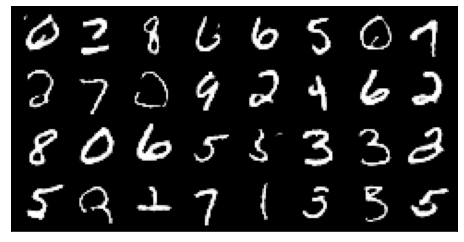

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:96,   G_loss:5.530415331313351,    D_loss:0.10029257440391971


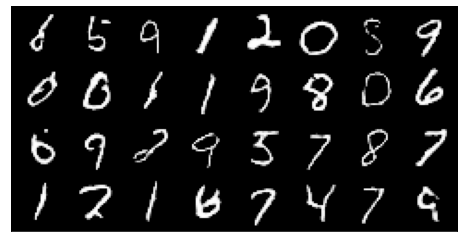

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:97,   G_loss:5.611823845583238,    D_loss:0.12704803703128417


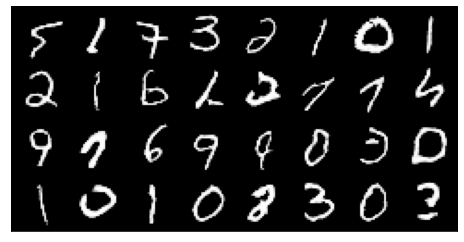

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:98,   G_loss:5.627544902217414,    D_loss:0.13783024253484025


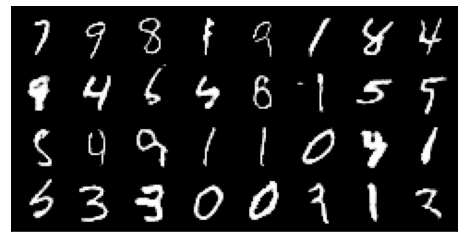

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:99,   G_loss:5.660714678672839,    D_loss:0.09719617699651714


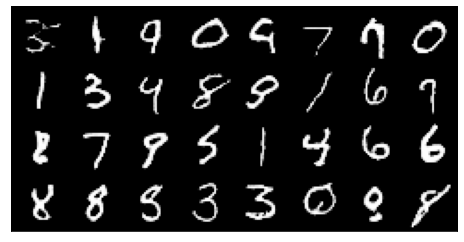

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:100,   G_loss:5.6244355376277655,    D_loss:0.15223490568769


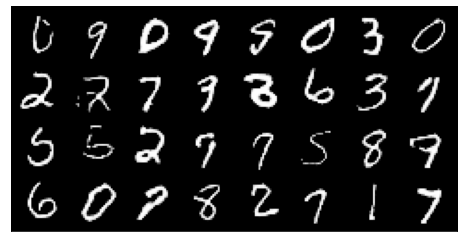

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:101,   G_loss:5.602573073939728,    D_loss:0.1172930179424445


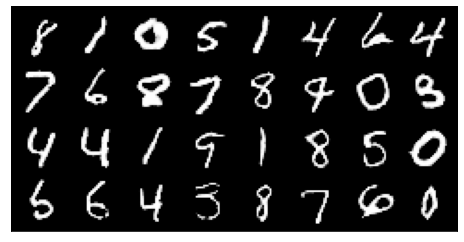

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:102,   G_loss:5.731512756680629,    D_loss:0.12389975066084775


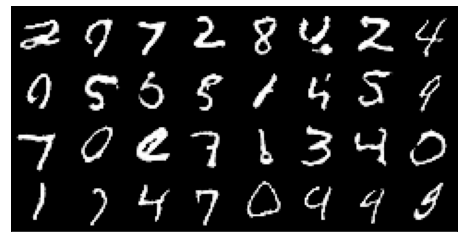

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:103,   G_loss:5.552476548563951,    D_loss:0.11203161385051831


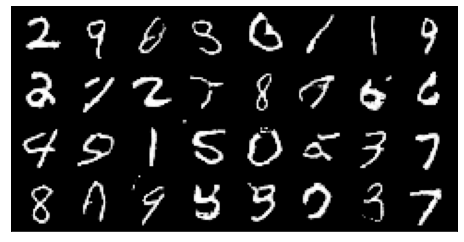

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:104,   G_loss:5.647945924290716,    D_loss:0.1779436470351434


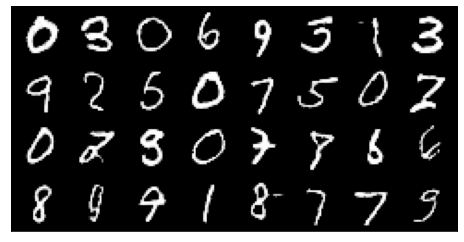

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:105,   G_loss:5.548685132694651,    D_loss:0.13913843276049656


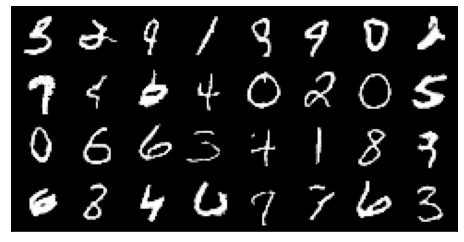

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:106,   G_loss:5.754964960028113,    D_loss:0.10241782341387246


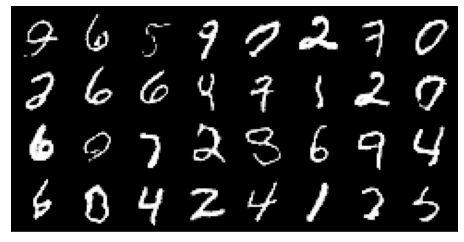

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:107,   G_loss:5.53240389200543,    D_loss:0.16298537265915455


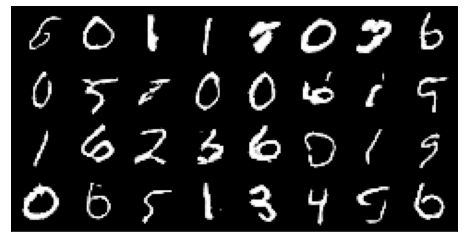

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:108,   G_loss:5.540793156684208,    D_loss:0.13848793789084607


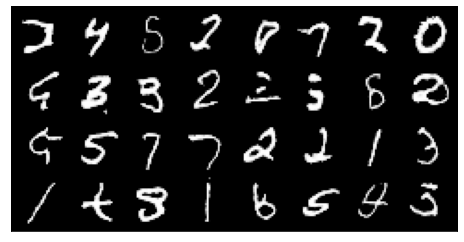

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:109,   G_loss:5.6334152510488975,    D_loss:0.16377390859482774


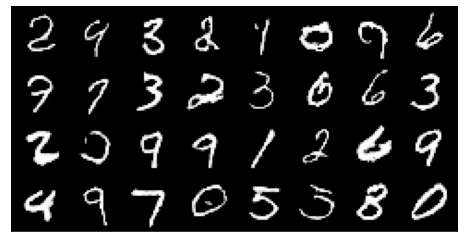

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:110,   G_loss:5.537108060520595,    D_loss:0.09502481080979895


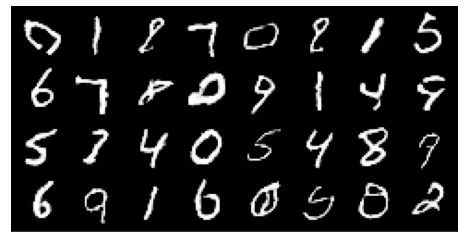

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:111,   G_loss:5.651742888920343,    D_loss:0.12700441990389988


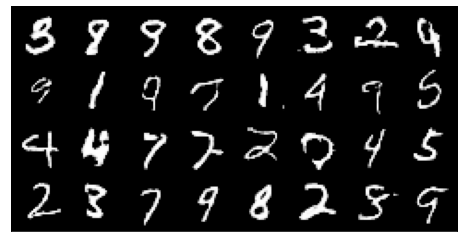

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:112,   G_loss:5.627670564980649,    D_loss:0.15491307243632316


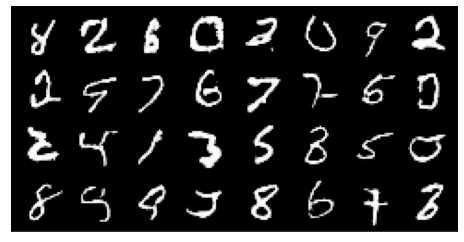

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:113,   G_loss:5.757224495699411,    D_loss:0.09957916707310305


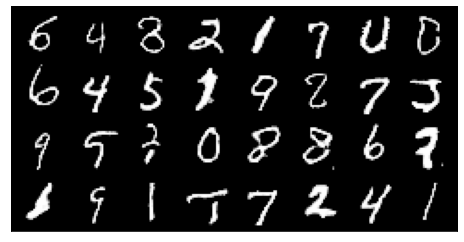

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:114,   G_loss:5.7044002019456705,    D_loss:0.17510753180975638


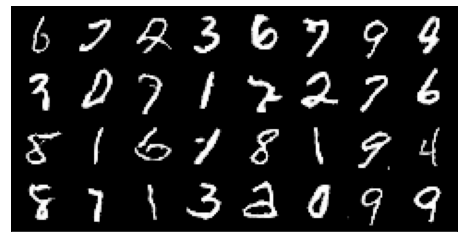

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:115,   G_loss:5.635005275196613,    D_loss:0.08141726635951005


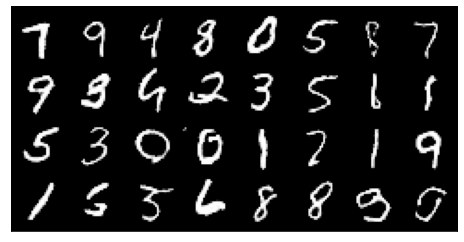

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:116,   G_loss:5.615184594890964,    D_loss:0.16029448527644183


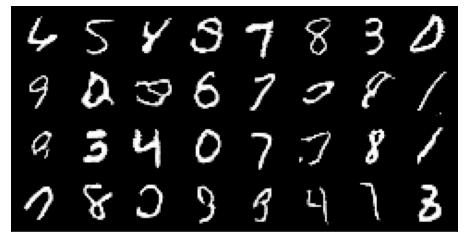

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:117,   G_loss:5.6304248187587715,    D_loss:0.1545314905522858


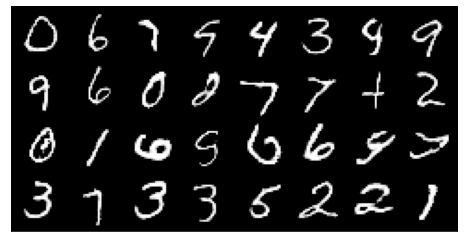

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:118,   G_loss:5.733152037490406,    D_loss:0.1330216053828869


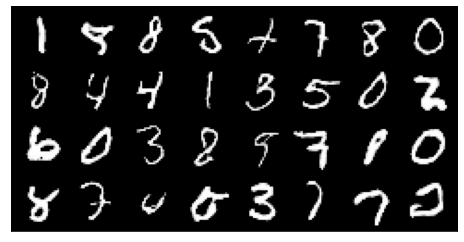

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:119,   G_loss:5.547005693064824,    D_loss:0.14803144073967428


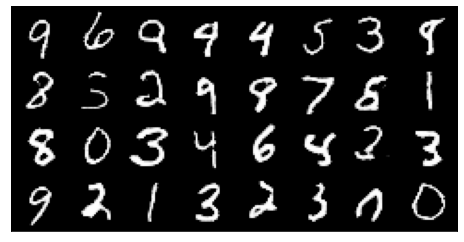

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:120,   G_loss:5.562753902410647,    D_loss:0.1382048453634003


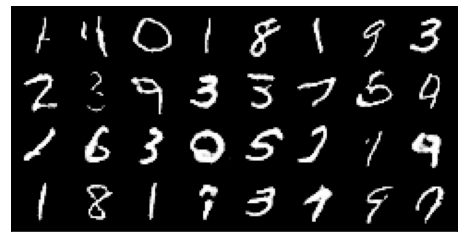

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:121,   G_loss:5.744119896468069,    D_loss:0.173071391236908


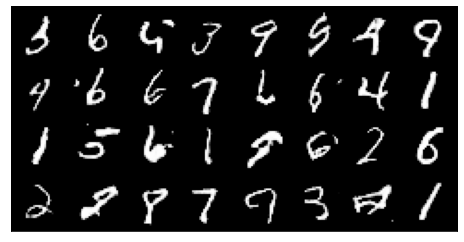

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:122,   G_loss:5.640734915571935,    D_loss:0.08651027844998854


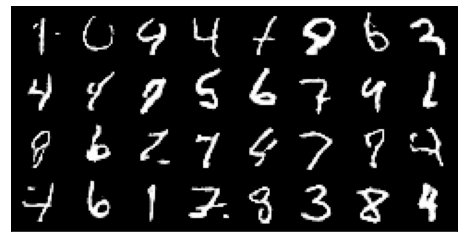

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:123,   G_loss:5.795699723438223,    D_loss:0.14308841910914702


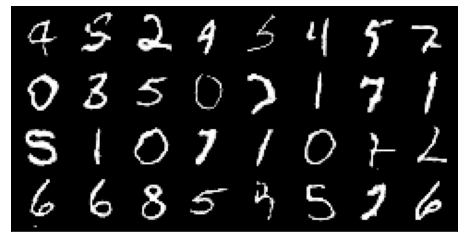

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:124,   G_loss:5.657945551637457,    D_loss:0.13254970892916804


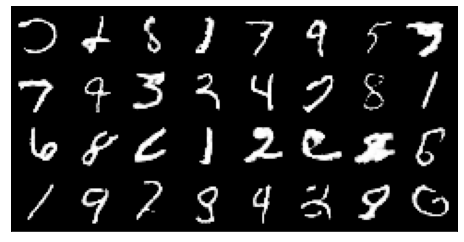

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:125,   G_loss:5.687495518181878,    D_loss:0.16384681864869474


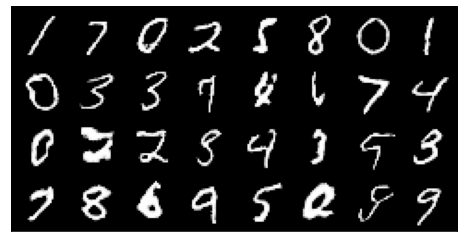

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:126,   G_loss:5.592508405510551,    D_loss:0.12285143566064176


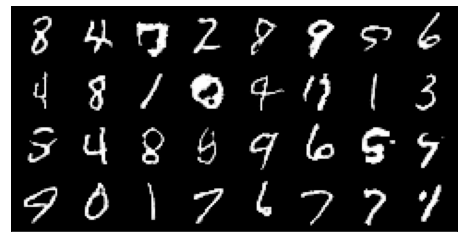

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:127,   G_loss:5.681534145384837,    D_loss:0.10357415694119121


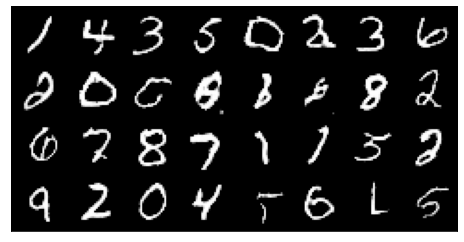

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:128,   G_loss:5.655558161914095,    D_loss:0.15725704320797773


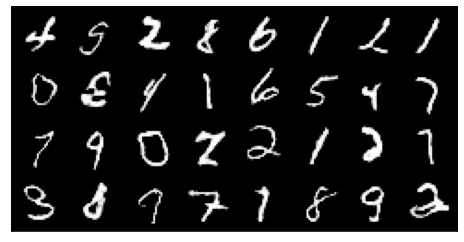

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:129,   G_loss:5.8408764581372745,    D_loss:0.10347421802106876


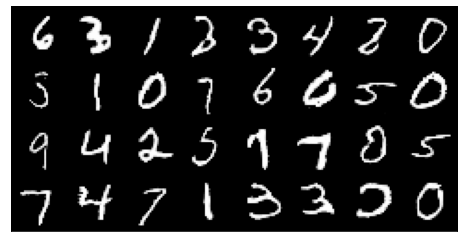

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:130,   G_loss:5.740697106342516,    D_loss:0.1353134797562831


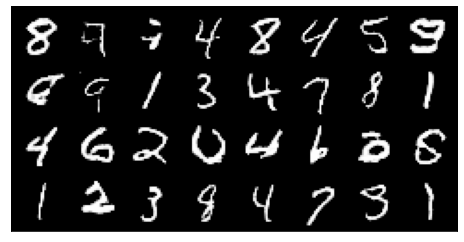

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:131,   G_loss:5.8150795320076725,    D_loss:0.09362864903791045


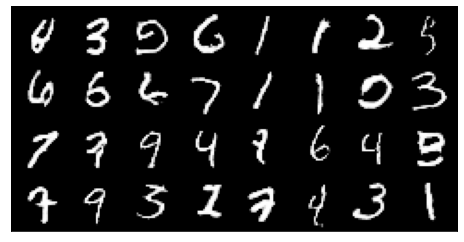

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:132,   G_loss:5.75643537920723,    D_loss:0.1433868436945795


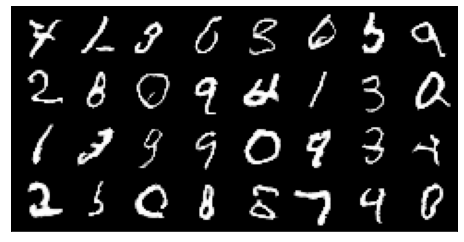

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:133,   G_loss:5.725206446117048,    D_loss:0.14379388879379457


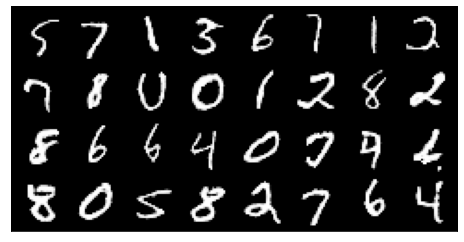

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:134,   G_loss:5.626181752077425,    D_loss:0.1286230951828484


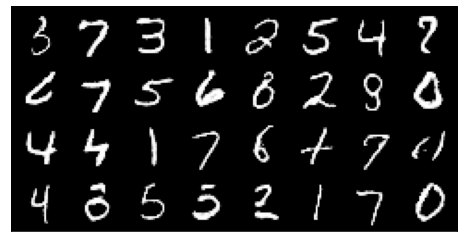

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:135,   G_loss:5.837451274048036,    D_loss:0.09390918102087095


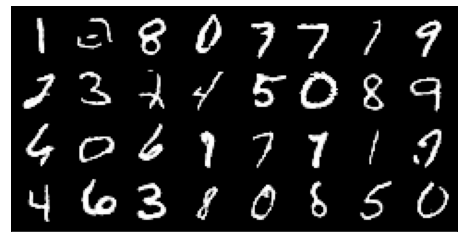

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:136,   G_loss:5.737699098757971,    D_loss:0.17092068818274206


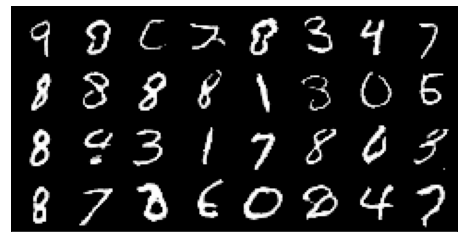

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:137,   G_loss:5.746881418152531,    D_loss:0.11892889142306998


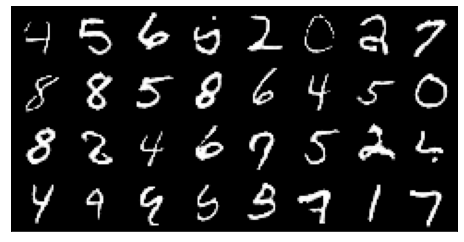

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:138,   G_loss:6.070619198400329,    D_loss:0.08011076353162205


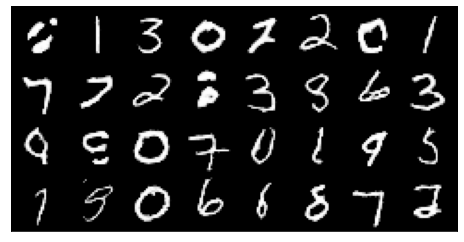

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:139,   G_loss:5.719078569968881,    D_loss:0.12712090597000233


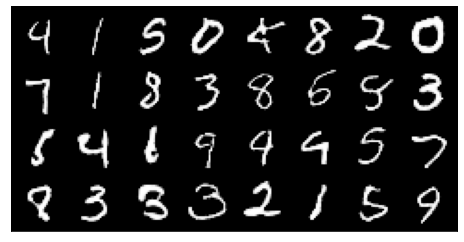

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:140,   G_loss:5.8896852964753785,    D_loss:0.08275698204302658


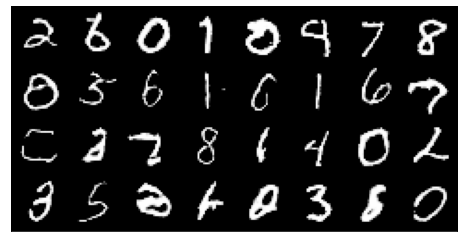

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:141,   G_loss:5.874310996613777,    D_loss:0.1418558628777904


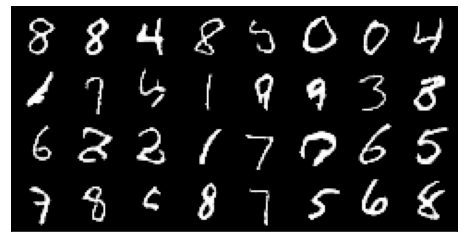

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:142,   G_loss:5.807666033347532,    D_loss:0.10854033344761103


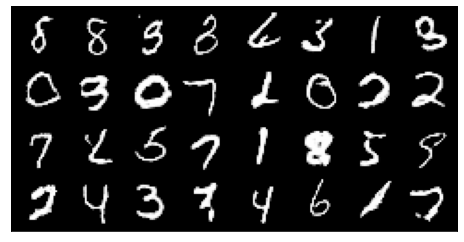

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:143,   G_loss:5.957206336769468,    D_loss:0.13131698771756686


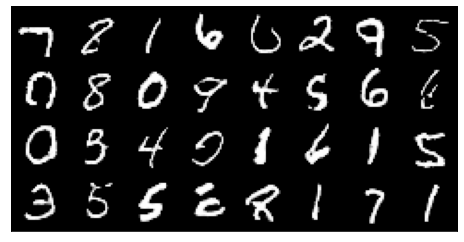

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:144,   G_loss:5.896172237866469,    D_loss:0.09823942119855114


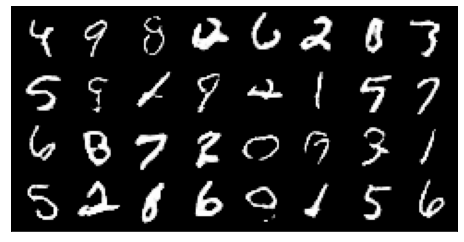

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:145,   G_loss:5.894820762023743,    D_loss:0.12347681312595925


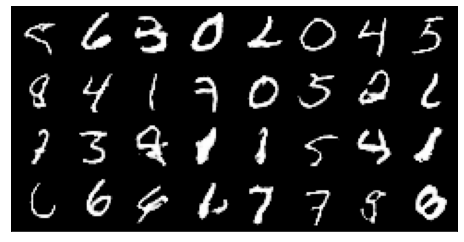

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:146,   G_loss:5.820781853931672,    D_loss:0.14831102171069832


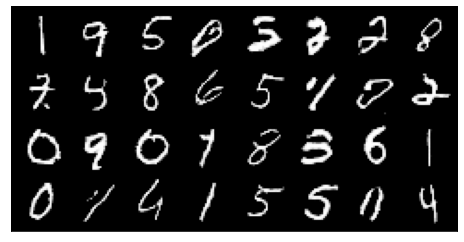

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:147,   G_loss:5.879618071925157,    D_loss:0.07592022967393766


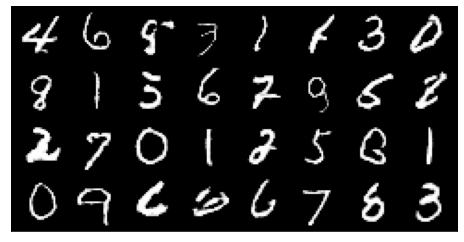

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:148,   G_loss:6.006372904440742,    D_loss:0.09241836437833746


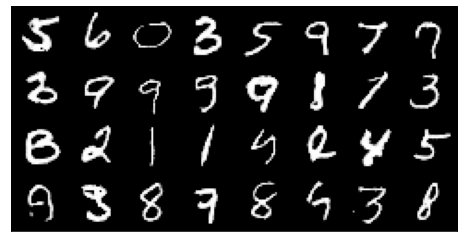

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:149,   G_loss:5.987991468992823,    D_loss:0.17097992556690148


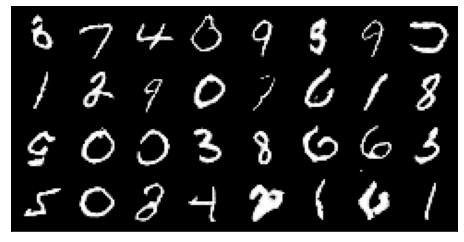

In [14]:
for epoch in range(150):
    G_loss_run = 0.0
    D_loss_run = 0.0
    for i, data in enumerate(trainLoader):
        X, _ = data
        X = X.to(device)
        mb_size = X.size(0)
        #print(X.shape)
        
        
        one_labels = torch.ones(mb_size, 1).to(device)
        zero_labels = torch.zeros(mb_size, 1).to(device)
        
        z = torch.randn(mb_size, 100,1,1).to(device)
        
        D_real = D(X)
        D_fake = D(G(z))

        D_real= torch.reshape(D_real, (mb_size, 1))
        D_fake= torch.reshape(D_fake, (mb_size, 1))
        #print(D_real.shape)
        #print(D_fake.shape)
        #break
        
        D_real_loss = F.binary_cross_entropy(D_real, one_labels)
        D_fake_loss = F.binary_cross_entropy(D_fake, zero_labels)
        D_loss = D_real_loss + D_fake_loss
        
        d_opt.zero_grad()
        D_loss.backward()
        d_opt.step()
        
        z = torch.randn(mb_size, 100,1,1).to(device)
        D_fake = D(G(z))
        D_fake= torch.reshape(D_fake, (mb_size, 1))
        G_loss = F.binary_cross_entropy(D_fake, one_labels)
        
        g_opt.zero_grad()
        G_loss.backward()
        g_opt.step()
        
        G_loss_run += G_loss.item()
        D_loss_run += D_loss.item()
        
    print('Epoch:{},   G_loss:{},    D_loss:{}'.format(epoch, G_loss_run/(i+1), D_loss_run/(i+1)))

    writer.add_scalar('Generator loss',G_loss_run,epoch)
    writer.add_scalar('Discriminator loss',D_loss_run,epoch)
                          
    
    samples = G(z).detach()
    samples = samples.view(samples.size(0), 1, 28, 28).cpu()
    img_grid = torchvision.utils.make_grid(samples)

    imshow(samples)
    writer.add_image('generated_images', img_grid,epoch)
writer.close() 



In [15]:
G_checkpoint = {'model': G,
          'state_dict': G.state_dict(),
          'loss' : G_loss_run,
          'optimizer' : g_opt.state_dict()}


PATH = "/content/gdrive/MyDrive/Github/CounterFactuals_GANs/MNIST/Weights/G_checkpoint_latest_" + str(epoch) + ".pth"
torch.save(G_checkpoint, PATH)



#Example for saving a checkpoint 
D_checkpoint = {'model': D,
          'state_dict': D.state_dict(),
          'loss' : D_loss_run,
          'optimizer' : d_opt.state_dict()}


PATH = "/content/gdrive/MyDrive/Github/CounterFactuals_GANs/MNIST/Weights/D_checkpoint_latest_" + str(epoch) + ".pth"
torch.save(D_checkpoint, PATH)


In [16]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [18]:
!git status

On branch main
Your branch is up to date with 'origin/main'.

Untracked files:
  (use "git add <file>..." to include in what will be committed)

	Training the GAN.ipynb
	Weights/
	__pycache__/
	data/
	runs/

nothing added to commit but untracked files present (use "git add" to track)


In [20]:
!git add .

In [21]:
!git commit -m "DC GAN trained till 100 epochs"


*** Please tell me who you are.

Run

  git config --global user.email "you@example.com"
  git config --global user.name "Your Name"

to set your account's default identity.
Omit --global to set the identity only in this repository.

fatal: unable to auto-detect email address (got 'root@d6cc675c2e34.(none)')


In [22]:
 git config --global user.email "mpattadkal@gmail.com"

SyntaxError: ignored